# CS 8267 - Fall 2023 - Final Project
## Text Summarization using TF-IDF, Seq2Seq, and Transformers based models
### By Caleb Greski, Faruk Muritala, Promi Roy, and Venkata Abhiram Chitty

In [117]:
import numpy as np
import pandas as pd
import re
import string
from nltk.tokenize import word_tokenize
from nltk import sent_tokenize, word_tokenize, PorterStemmer
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import math

In [134]:
%ls
%cd

nltk_data/
/root


In [133]:
%cd .

/root


In [119]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [126]:
file_path = '/content/drive/MyDrive/NN_ProjectData/clean_data.csv'

data=pd.read_csv(file_path)

In [121]:
data

,Unnamed: 0,article,highlights
0,0,ever notice plane seat appear get smaller smaller increase number people take sky experts question pack plan put passengers risk say shrink space aeroplanes uncomfortable put health safety danger ...,experts question pack plan put passengers risk us consumer advisory group say minimum space must stipulate safety test conduct plan leg room airlines offer
1,1,drink teenage boy rescue security jump lions enclosure zoo western india rahul kumar clamber enclosure fence kamla nehru zoological park ahmedabad begin run towards animals shout would kill mr kum...,drink teenage boy climb lion enclosure zoo west india rahul kumar run towards animals shout today kill lion fortunately fell moat reach lions rescue
2,2,dougie freedman verge agree new twoyear deal remain nottingham forest freedman stabilise forest since replace cult hero stuart pearce club owners please job do city grind dougie freedman set sign ...,nottingham forest close extend dougie freedmans contract forest boss take former manager stuart pearce february freedman since lead club ninth championship
3,3,liverpool target neto also want psg club spain brendan rodgers face stiff competition land fiorentina goalkeeper accord brazilians agent stefano castagna reds link move yearold whose contract expi...,fiorentina goalkeeper neto link liverpool arsenal neto join firoentina brazilian outfit atletico paranaense also want psg spanish club accord agent click latest liverpool news
4,4,bruce jenner break silence twohour interview diane sawyer later month former olympian reality tv star speak farranging interview sawyer special edition friday april abc news announce monday interv...,tellall interview reality tv star air friday april come amid continue speculation transition woman follow involvement deadly car crash february interview also one diane sawyers first appearances t...
...,...,...,...
11485,11485,young earth may collide body similar planet mercury say new paper dramatic event could explain planet hot core give magnetic field could also explain certain rareearth elements earth mantle seem o...,oxford scientists say mercurylike body strike young earth marssized object would heat source planet object could responsible create moon also explain rareearth elements come
11486,11486,man face trial help former lover strangle woman sexual encounter tell court former flame twist desire kill dig victims crude grave micheal john duffy plead guilty murder colleen deborah ayers whos...,man accuse help former lover kill woman sexual encounter micheal john duffy plead guilty murder colleen deborah ayers court hear strangle ms ayers ringleader rachel evans say coaccused evans one t...
11487,11487,dozen metal implement arrange neat row table next bed look like something frankenstein might apply monsters neck begin feel nervous earth get pristine white room add feel im undergo major surgery ...,marianne power try tune fork facial hale clinic london utilise tune fork make different pitch sound strike say afterwards skin look plumper pink rather white
11488,11488,brook lopez dominate twin brother robin point nine rebound brooklyn net beat weaken portland trail blazers monday game nba schedule trail blazers leave lamarcus aldridge others home game postpone ...,brooklyn net beat portland trail blazers new york brook lopez score point net move seventh trail blazers without lamarcus aldridge number others


In [122]:
# Missing Values
num_missing_desc = data.isnull().sum()[2]    # No. of values with msising descriptions
print('Number of missing values: ' + str(num_missing_desc))
data = data.dropna()

Number of missing values: 0


In [123]:
data = data.drop(['Unnamed: 0'], axis = 1)
data

,article,highlights
0,ever notice plane seat appear get smaller smaller increase number people take sky experts question pack plan put passengers risk say shrink space aeroplanes uncomfortable put health safety danger ...,experts question pack plan put passengers risk us consumer advisory group say minimum space must stipulate safety test conduct plan leg room airlines offer
1,drink teenage boy rescue security jump lions enclosure zoo western india rahul kumar clamber enclosure fence kamla nehru zoological park ahmedabad begin run towards animals shout would kill mr kum...,drink teenage boy climb lion enclosure zoo west india rahul kumar run towards animals shout today kill lion fortunately fell moat reach lions rescue
2,dougie freedman verge agree new twoyear deal remain nottingham forest freedman stabilise forest since replace cult hero stuart pearce club owners please job do city grind dougie freedman set sign ...,nottingham forest close extend dougie freedmans contract forest boss take former manager stuart pearce february freedman since lead club ninth championship
3,liverpool target neto also want psg club spain brendan rodgers face stiff competition land fiorentina goalkeeper accord brazilians agent stefano castagna reds link move yearold whose contract expi...,fiorentina goalkeeper neto link liverpool arsenal neto join firoentina brazilian outfit atletico paranaense also want psg spanish club accord agent click latest liverpool news
4,bruce jenner break silence twohour interview diane sawyer later month former olympian reality tv star speak farranging interview sawyer special edition friday april abc news announce monday interv...,tellall interview reality tv star air friday april come amid continue speculation transition woman follow involvement deadly car crash february interview also one diane sawyers first appearances t...
...,...,...
11485,young earth may collide body similar planet mercury say new paper dramatic event could explain planet hot core give magnetic field could also explain certain rareearth elements earth mantle seem o...,oxford scientists say mercurylike body strike young earth marssized object would heat source planet object could responsible create moon also explain rareearth elements come
11486,man face trial help former lover strangle woman sexual encounter tell court former flame twist desire kill dig victims crude grave micheal john duffy plead guilty murder colleen deborah ayers whos...,man accuse help former lover kill woman sexual encounter micheal john duffy plead guilty murder colleen deborah ayers court hear strangle ms ayers ringleader rachel evans say coaccused evans one t...
11487,dozen metal implement arrange neat row table next bed look like something frankenstein might apply monsters neck begin feel nervous earth get pristine white room add feel im undergo major surgery ...,marianne power try tune fork facial hale clinic london utilise tune fork make different pitch sound strike say afterwards skin look plumper pink rather white
11488,brook lopez dominate twin brother robin point nine rebound brooklyn net beat weaken portland trail blazers monday game nba schedule trail blazers leave lamarcus aldridge others home game postpone ...,brooklyn net beat portland trail blazers new york brook lopez score point net move seventh trail blazers without lamarcus aldridge number others


# Text Cleaning

In [7]:
cleaning_data = True
if cleaning_data:
  import nltk
  nltk.download('punkt')
  nltk.download('stopwords')
  nltk.download('wordnet')
  nltk.download('omw-1.4')

  # Handle missing values
  data['article'] = data['article'].fillna("")
  data['highlights'] = data['highlights'].fillna("")

  # Convert to lowercase
  data['article'] = data['article'].map(lambda x: x.lower())
  data['highlights'] = data['highlights'].map(lambda x: x.lower())

  # Remove numbers
  data['article'] = data['article'].map(lambda x: re.sub(r'\d+', '', x))
  data['highlights'] = data['highlights'].map(lambda x: re.sub(r'\d+', '', x))

  # Remove punctuation
  data['article'] = data['article'].map(lambda x: x.translate(x.maketrans('', '', string.punctuation)))
  data['highlights'] = data['highlights'].map(lambda x: x.translate(x.maketrans('', '', string.punctuation)))

  # Remove white spaces
  data['article'] = data['article'].map(lambda x: x.strip())
  data['highlights'] = data['highlights'].map(lambda x: x.strip())

  # Tokenize into words
  data['article'] = data['article'].map(lambda x: word_tokenize(x))
  data['highlights'] = data['highlights'].map(lambda x: word_tokenize(x))

  # Remove non alphabetic tokens
  data['article'] = data['article'].map(lambda x: [word for word in x if word.isalpha()])
  data['highlights'] = data['highlights'].map(lambda x: [word for word in x if word.isalpha()])

  # Filter out stop words
  stop_words = set(stopwords.words('english'))
  data['article'] = data['article'].map(lambda x: [w for w in x if not w in stop_words])
  data['highlights'] = data['highlights'].map(lambda x: [w for w in x if not w in stop_words])

  # Word Lemmatization
  lem = WordNetLemmatizer()
  data['article'] = data['article'].map(lambda x: [lem.lemmatize(word, "v") for word in x])
  data['highlights'] = data['highlights'].map(lambda x: [lem.lemmatize(word, "v") for word in x])

  # Turn lists back to string
  data['article'] = data['article'].map(lambda x: ' '.join(x))
  data['highlights'] = data['highlights'].map(lambda x: ' '.join(x))

In [8]:
data

,article,highlights
0,ever notice plane seat appear get smaller smal...,experts question pack plan put passengers risk...
1,drink teenage boy rescue security jump lions e...,drink teenage boy climb lion enclosure zoo wes...
2,dougie freedman verge agree new twoyear deal r...,nottingham forest close extend dougie freedman...
3,liverpool target neto also want psg club spain...,fiorentina goalkeeper neto link liverpool arse...
4,bruce jenner break silence twohour interview d...,tellall interview reality tv star air friday a...
...,...,...
11485,young earth may collide body similar planet me...,oxford scientists say mercurylike body strike ...
11486,man face trial help former lover strangle woma...,man accuse help former lover kill woman sexual...
11487,dozen metal implement arrange neat row table n...,marianne power try tune fork facial hale clini...
11488,brook lopez dominate twin brother robin point ...,brooklyn net beat portland trail blazers new y...


In [9]:
df = data

In [10]:
def _create_frequency_table(text_string) -> dict:

    stopWords = set(stopwords.words("english"))
    words = word_tokenize(text_string)
    ps = PorterStemmer()

    freqTable = dict()
    for word in words:
        word = ps.stem(word)
        if word in stopWords:
            continue
        if word in freqTable:
            freqTable[word] += 1
        else:
            freqTable[word] = 1

    return freqTable

In [11]:
def _create_frequency_matrix(sentences):
    frequency_matrix = {}
    stopWords = set(stopwords.words("english"))
    ps = PorterStemmer()

    for sent in sentences:
        freq_table = {}
        words = word_tokenize(sent)
        for word in words:
            word = word.lower()
            word = ps.stem(word)
            if word in stopWords:
                continue

            if word in freq_table:
                freq_table[word] += 1
            else:
                freq_table[word] = 1

        frequency_matrix[sent[:15]] = freq_table

    return frequency_matrix

In [12]:
def _create_tf_matrix(freq_matrix):
    tf_matrix = {}

    for sent, f_table in freq_matrix.items():
        tf_table = {}

        count_words_in_sentence = len(f_table)
        for word, count in f_table.items():
            tf_table[word] = count / count_words_in_sentence

        tf_matrix[sent] = tf_table

    return tf_matrix


In [13]:
def _create_documents_per_words(freq_matrix):
    word_per_doc_table = {}

    for sent, f_table in freq_matrix.items():
        for word, count in f_table.items():
            if word in word_per_doc_table:
                word_per_doc_table[word] += 1
            else:
                word_per_doc_table[word] = 1

    return word_per_doc_table


In [14]:
def _create_idf_matrix(freq_matrix, count_doc_per_words, total_documents):
    idf_matrix = {}

    for sent, f_table in freq_matrix.items():
        idf_table = {}

        for word in f_table.keys():
            idf_table[word] = math.log10(total_documents / float(count_doc_per_words[word]))

        idf_matrix[sent] = idf_table

    return idf_matrix

In [15]:
def _create_tf_idf_matrix(tf_matrix, idf_matrix):
    tf_idf_matrix = {}

    for (sent1, f_table1), (sent2, f_table2) in zip(tf_matrix.items(), idf_matrix.items()):

        tf_idf_table = {}

        for (word1, value1), (word2, value2) in zip(f_table1.items(),
                                                    f_table2.items()):  # here, keys are the same in both the table
            tf_idf_table[word1] = float(value1 * value2)

        tf_idf_matrix[sent1] = tf_idf_table

    return tf_idf_matrix

In [16]:
def _score_sentences(tf_idf_matrix) -> dict:


    sentenceValue = {}

    for sent, f_table in tf_idf_matrix.items():
        total_score_per_sentence = 0

        count_words_in_sentence = len(f_table)
        for word, score in f_table.items():
            total_score_per_sentence += score

        sentenceValue[sent] = total_score_per_sentence / count_words_in_sentence

    return sentenceValue

In [17]:
def _find_average_score(sentenceValue) -> int:

    sumValues = 0
    for entry in sentenceValue:
        sumValues += sentenceValue[entry]
        # Average value of a sentence from original summary_text
    average = (sumValues / len(sentenceValue))

    return average



In [18]:
def _generate_summary(sentences, sentenceValue, threshold):
    sentence_count = 0
    summary = ''

    for sentence in sentences:
        if sentence[:15] in sentenceValue and sentenceValue[sentence[:15]] >= (threshold):
            summary += " " + sentence
            sentence_count += 1

    return summary

In [19]:
sent_tokenize(df['article'][0])

['ever notice plane seat appear get smaller smaller increase number people take sky experts question pack plan put passengers risk say shrink space aeroplanes uncomfortable put health safety danger squabble arm rest shrink space plan put health safety danger week us consumer advisory group set department transportation say public hear government happy set standards animals fly plan doesnt stipulate minimum amount space humans world animals right space food humans say charlie leocha consumer representative committee time dot faa take stand humane treatment passengers could crowd plan lead serious issue fight space overhead lockers crash elbow seat back kick test conduct faa use plan inch pitch standard airlines decrease many economy seat unite airlines inch room airlines offer little inch cynthia corbertt human factor researcher federal aviation administration conduct test quickly passengers leave plane test conduct use plan inch row seat standard airlines decrease report detroit news d

In [20]:
type(df)

pandas.core.frame.DataFrame

In [21]:
df['article'][0]

'ever notice plane seat appear get smaller smaller increase number people take sky experts question pack plan put passengers risk say shrink space aeroplanes uncomfortable put health safety danger squabble arm rest shrink space plan put health safety danger week us consumer advisory group set department transportation say public hear government happy set standards animals fly plan doesnt stipulate minimum amount space humans world animals right space food humans say charlie leocha consumer representative committee time dot faa take stand humane treatment passengers could crowd plan lead serious issue fight space overhead lockers crash elbow seat back kick test conduct faa use plan inch pitch standard airlines decrease many economy seat unite airlines inch room airlines offer little inch cynthia corbertt human factor researcher federal aviation administration conduct test quickly passengers leave plane test conduct use plan inch row seat standard airlines decrease report detroit news di

In [22]:
freq_matrix = _create_frequency_matrix(df['article'])
#print(freq_matrix)

# 3 Calculate TermFrequency and generate a matrix
tf_matrix = _create_tf_matrix(freq_matrix)
#print(tf_matrix)

In [23]:
# 4 creating table for documents per words
count_doc_per_words = _create_documents_per_words(freq_matrix)
#print(count_doc_per_words)

# 5 Calculate IDF and generate a matrix
idf_matrix = _create_idf_matrix(freq_matrix, count_doc_per_words, len(df['article']))
#print(idf_matrix)

# 6 Calculate TF-IDF and generate a matrix
tf_idf_matrix = _create_tf_idf_matrix(tf_matrix, idf_matrix)
#print(tf_idf_matrix)

# 7 Important Algorithm: score the sentences
sentence_scores = _score_sentences(tf_idf_matrix)
#print(sentence_scores)

# 8 Find the threshold
threshold = _find_average_score(sentence_scores)
#print(threshold)

# 9 Important Algorithm: Generate the summary
summary = _generate_summary(df['article'][0], sentence_scores, 1.3 * threshold)

In [24]:
tf_idf_matrix

{'ever notice pla': {'ever': 0.007407384397877307,
  'notic': 0.010776368021717539,
  'plane': 0.026362558884907364,
  'seat': 0.10876731352443449,
  'appear': 0.005163069401742498,
  'get': 0.002634863135725316,
  'smaller': 0.028001813116277984,
  'increas': 0.009205268986456495,
  'number': 0.006445122297632586,
  'peopl': 0.003545332399347991,
  'take': 0.004151337598916596,
  'sky': 0.011654227859591866,
  'expert': 0.009862708770729872,
  'question': 0.007900418835591788,
  'pack': 0.012036416475265701,
  'plan': 0.039215901936311755,
  'put': 0.015167398877420857,
  'passeng': 0.03653823804812925,
  'risk': 0.00965718089410144,
  'say': 0.002925585353040761,
  'shrink': 0.037024515632517165,
  'space': 0.0649572107766277,
  'aeroplan': 0.02358225922758343,
  'uncomfort': 0.01669512647793177,
  'health': 0.01812757394036957,
  'safeti': 0.02082359580032641,
  'danger': 0.018589068671270623,
  'squabbl': 0.028818833644669358,
  'arm': 0.009261818897650596,
  'rest': 0.009398718866

In [25]:
threshold

0.013731953476849018

In [26]:
' '.join([k for (k,v) in tf_idf_matrix[list(tf_idf_matrix.keys())[0]].items() if v > threshold])

'plane seat smaller plan put passeng shrink space aeroplan uncomfort health safeti danger squabbl consum advisori standard anim stipul minimum human charli leocha committe dot faa overhead locker elbow test conduct inch pitch airlin decreas economi unit offer cynthia corbertt aviat detroit gulf air asia airway easyjet thomson haul virgin atlant'

In [27]:
' '.join([k for (k,v) in tf_idf_matrix[list(tf_idf_matrix.keys())[1]].items() if v > threshold])

'drink teenag rescu secur lion enclosur zoo western india rahul kumar clamber fenc kamla nehru zoolog ahmedabad begin run toward anim shout kill mr explain afterward id stand chanc predat intox climb today suddenli dash spokesman guard fortun moat fell polic brave fool stock caution psychiatr evalu asleep tragedi delhi maul tiger indian'

In [28]:
summarize = ' '.join([k for (k,v) in tf_idf_matrix[list(tf_idf_matrix.keys())[1]].items() if v > threshold])

In [29]:
from nltk.metrics import edit_distance
edit_distance(df['highlights'][1], summarize)

224

In [30]:
edit_distance(df['highlights'][1], df['article'][1])

959

In [31]:
edit_distance(summarize, df['article'][1])

769

In [32]:
all_summary = [' '.join([k for (k,v) in tf_idf_matrix[list(tf_idf_matrix.keys())[i]].items() if v > threshold]) for i in range(30)]

In [33]:
all_summary

['plane seat smaller plan put passeng shrink space aeroplan uncomfort health safeti danger squabbl consum advisori standard anim stipul minimum human charli leocha committe dot faa overhead locker elbow test conduct inch pitch airlin decreas economi unit offer cynthia corbertt aviat detroit gulf air asia airway easyjet thomson haul virgin atlant',
 'drink teenag rescu secur lion enclosur zoo western india rahul kumar clamber fenc kamla nehru zoolog ahmedabad begin run toward anim shout kill mr explain afterward id stand chanc predat intox climb today suddenli dash spokesman guard fortun moat fell polic brave fool stock caution psychiatr evalu asleep tragedi delhi maul tiger indian',
 'dougi freedman verg agre new twoyear deal remain nottingham forest stabilis sinc replac cult hero stuart pearc club owner pleas job citi grind set sign impress februari audaci attempt playoff tail recent prevent ownership move secur contract next season',
 'liverpool neto psg club spain brendan rodger sti

In [34]:
!pip install evaluate
!pip install rouge_score

In [35]:
import evaluate
rouge = evaluate.load('rouge')

results = rouge.compute(predictions=all_summary, references=df['article'][0:30])
print(results)

{'rouge1': 0.16388523513104436, 'rouge2': 0.05121701830056891, 'rougeL': 0.16077597238813043, 'rougeLsum': 0.16022893455914428}


# Sequence 2 Sequence Model

In [36]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Mon Nov 27 19:37:29 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P0    24W / 300W |      0MiB / 16384MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [37]:
!pip install -U nltk

In [38]:
#df = pd.read_csv(file_path, encoding='iso-8859-1')

In [39]:
import nltk
import numpy as np
import pandas as pd
import pandas as pd

In [40]:
import pandas as pd

raw = df['article']

summary = df['highlights']


In [41]:
import pandas as pd

pre_data = pd.DataFrame()

pre_data['text'] = df['article']

pre_data['summary'] = df['highlights']

In [42]:
pre_data.head(2)

,text,summary
0,ever notice plane seat appear get smaller smal...,experts question pack plan put passengers risk...
1,drink teenage boy rescue security jump lions e...,drink teenage boy climb lion enclosure zoo wes...


**Seq2Seq LSTM Modelling**

In [43]:
pre_data['text'][:10]

0    ever notice plane seat appear get smaller smal...
1    drink teenage boy rescue security jump lions e...
2    dougie freedman verge agree new twoyear deal r...
3    liverpool target neto also want psg club spain...
4    bruce jenner break silence twohour interview d...
5    moment crew firefighters struggle haul giant p...
6    amount time people spend listen bbc radio drop...
7    cnnso youd like full house reunion spinoff get...
8    pm former world champion ken doherty pot final...
9    gang six men jail total years convict string s...
Name: text, dtype: object

In [44]:
text_count = []
summary_count = []

In [45]:
for sent in pre_data['text']:
    text_count.append(len(sent.split()))
for sent in pre_data['summary']:
    summary_count.append(len(sent.split()))

In [46]:
graph_df= pd.DataFrame()
graph_df['text']=text_count
graph_df['summary']=summary_count

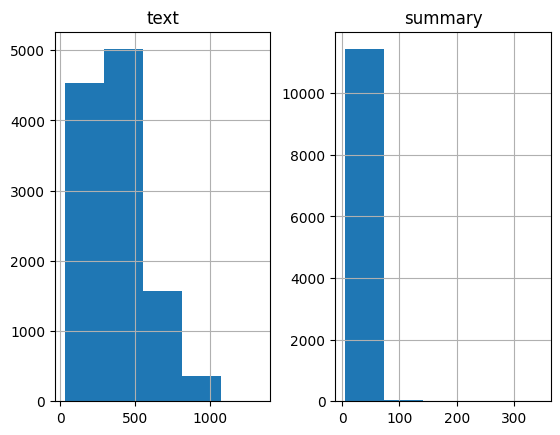

In [47]:
import matplotlib.pyplot as plt

graph_df.hist(bins = 5)
plt.show()

In [48]:
count=0
for i in pre_data['summary']:
    if(len(i.split())<=50):
        count=count+1
print(count/len(pre_data['summary']))

0.9380330722367276


In [49]:
count=0
for i in pre_data['text']:
    if(len(i.split())<=500):
        count=count+1
print(count/len(pre_data['text']))

0.7801566579634465


In [50]:
max_text_len=500
max_summary_len=50

In [51]:
cleaned_text =np.array(pre_data['text'])
cleaned_summary=np.array(pre_data['summary'])

short_text=[]
short_summary=[]

#for i in range(len(cleaned_text)):
#  short_text.append(" ".join(cleaned_text[i].split()[:max_text_len]))
#  short_summary.append(" ".join(cleaned_summary[i].split()[:max_summary_len]))

for i in range(len(cleaned_text)):
    if(len(cleaned_summary[i].split())<=max_summary_len and len(cleaned_text[i].split())<=max_text_len):
        short_text.append(cleaned_text[i])
        short_summary.append(cleaned_summary[i])

post_pre_data=pd.DataFrame({'text':short_text,'summary':short_summary})

In [52]:
post_pre_data.head(2)

,text,summary
0,ever notice plane seat appear get smaller smal...,experts question pack plan put passengers risk...
1,drink teenage boy rescue security jump lions e...,drink teenage boy climb lion enclosure zoo wes...


In [53]:
post_pre_data['summary'] = post_pre_data['summary'].apply(lambda x : 'sostok '+ x + ' eostok')

In [54]:
post_pre_data.head(2)

,text,summary
0,ever notice plane seat appear get smaller smal...,sostok experts question pack plan put passenge...
1,drink teenage boy rescue security jump lions e...,sostok drink teenage boy climb lion enclosure ...


In [55]:
from sklearn.model_selection import train_test_split
x_tr,x_val,y_tr,y_val=train_test_split(np.array(post_pre_data['text']),np.array(post_pre_data['summary']),test_size=0.1,random_state=0,shuffle=True)

In [56]:
#Lets tokenize the text to get the vocab count , you can use Spacy here also

from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences

#prepare a tokenizer for reviews on training data
x_tknizer = Tokenizer()
x_tknizer.fit_on_texts(list(x_tr))

In [57]:
thresh=4

count=0
total_count=0
frequency=0
total_frequency=0

for key,value in x_tknizer.word_counts.items():
    total_count=total_count+1
    total_frequency=total_frequency+value
    if(value<thresh):
        count=count+1
        frequency=frequency+value

print("% of rare words in vocabulary:",(count/total_count)*100)
print("Total Coverage of rare words:",(frequency/total_frequency)*100)

% of rare words in vocabulary: 59.171906995657665
Total Coverage of rare words: 2.7341114581912973


In [58]:
x_tknizer = Tokenizer(num_words=total_count-count)
x_tknizer.fit_on_texts(list(x_tr))

x_tr_seq    =   x_tknizer.texts_to_sequences(x_tr)
x_val_seq   =   x_tknizer.texts_to_sequences(x_val)

x_tr    =   pad_sequences(x_tr_seq,  maxlen=max_text_len, padding='post')
x_val   =   pad_sequences(x_val_seq, maxlen=max_text_len, padding='post')

x_voc   =  x_tknizer.num_words + 1

print("Size of vocabulary in X = {}".format(x_voc))

Size of vocabulary in X = 28114


In [59]:
y_tknizer = Tokenizer()
y_tknizer.fit_on_texts(list(y_tr))

In [60]:
thresh=6

count=0
total_count=0
frequency=0
total_frequency=0

for key,value in y_tknizer.word_counts.items():
    total_count=total_count+1
    total_frequency=total_frequency+value
    if(value<thresh):
        count=count+1
        frequency=frequency+value

print("% of rare words in vocabulary:",(count/total_count)*100)
print("Total Coverage of rare words:",(frequency/total_frequency)*100)

% of rare words in vocabulary: 78.46072917088172
Total Coverage of rare words: 14.24831681512148


In [61]:
y_tknizer = Tokenizer(num_words=total_count-count)
y_tknizer.fit_on_texts(list(y_tr))

y_tr_seq    =   y_tknizer.texts_to_sequences(y_tr)
y_val_seq   =   y_tknizer.texts_to_sequences(y_val)

y_tr    =   pad_sequences(y_tr_seq, maxlen=max_summary_len, padding='post')
y_val   =   pad_sequences(y_val_seq, maxlen=max_summary_len, padding='post')

y_voc  =   y_tknizer.num_words +1
print("Size of vocabulary in Y = {}".format(y_voc))

Size of vocabulary in Y = 5324


We will now delete "Summary" i.e Y (both train and val) which has only _START_ and _END_

In [62]:
ind=[]
for i in range(len(y_tr)):
    count=0
    for j in y_tr[i]:
        if j!=0:
            count=count+1
    if(count==2):
        ind.append(i)

y_tr=np.delete(y_tr,ind, axis=0)
x_tr=np.delete(x_tr,ind, axis=0)

In [63]:
ind=[]
for i in range(len(y_val)):
    count=0
    for j in y_val[i]:
        if j!=0:
            count=count+1
    if(count==2):
        ind.append(i)

y_val=np.delete(y_val,ind, axis=0)
x_val=np.delete(x_val,ind, axis=0)

In [64]:
GRU = False
if GRU:
  from keras import backend as K
  import gensim
  from numpy import *
  import numpy as np
  import pandas as pd
  import re
  from bs4 import BeautifulSoup
  from keras.preprocessing.text import Tokenizer
  from keras.preprocessing.sequence import pad_sequences
  from nltk.corpus import stopwords
  from tensorflow.keras.layers import Input, LSTM, Embedding, Dense, Concatenate, TimeDistributed
  from tensorflow.keras.models import Model
  from tensorflow.keras.callbacks import EarlyStopping
  import warnings
  pd.set_option("display.max_colwidth", 200)
  warnings.filterwarnings("ignore")

  K.clear_session()

  latent_dim = 200
  embedding_dim=100

  encoder = GRU(latent_dim, return_state=True)
  encoder_outputs, state_h = encoder(encoder_inputs)

  decoder_inputs = Input(shape=(None, num_decoder_tokens))
  decoder_gru = GRU(latent_dim, return_sequences=True)
  decoder_outputs = decoder_gru(decoder_inputs, initial_state=state_h)
  decoder_dense = Dense(num_decoder_tokens, activation='softmax')
  decoder_outputs = decoder_dense(decoder_outputs)
  model = Model([encoder_inputs, decoder_inputs], decoder_outputs)

  model.summary()

In [65]:
LSTM = True
if LSTM:
  from keras import backend as K
  import gensim
  from numpy import *
  import numpy as np
  import pandas as pd
  import re
  from bs4 import BeautifulSoup
  from keras.preprocessing.text import Tokenizer
  from keras.preprocessing.sequence import pad_sequences
  from nltk.corpus import stopwords
  from tensorflow.keras.layers import Input, LSTM, Embedding, Dense, Concatenate, TimeDistributed
  from tensorflow.keras.models import Model
  from tensorflow.keras.callbacks import EarlyStopping
  import warnings
  pd.set_option("display.max_colwidth", 200)
  warnings.filterwarnings("ignore")

  K.clear_session()

  latent_dim = 200
  embedding_dim=100

  encoder_inputs = Input(shape=(max_text_len,))

  enc_emb =  Embedding(x_voc, embedding_dim,trainable=True)(encoder_inputs)

  encoder_lstm1 = LSTM(latent_dim,return_sequences=True,return_state=True,dropout=0.2,recurrent_dropout=0.2)
  encoder_output1, state_h1, state_c1 = encoder_lstm1(enc_emb)

  encoder_lstm2 = LSTM(latent_dim,return_sequences=True,return_state=True,dropout=0.2,recurrent_dropout=0.2)
  encoder_output2, state_h2, state_c2 = encoder_lstm2(encoder_output1)

  encoder_lstm3=LSTM(latent_dim, return_state=True, return_sequences=True,dropout=0.2,recurrent_dropout=0.2)
  encoder_outputs, state_h, state_c= encoder_lstm3(encoder_output2)

  decoder_inputs = Input(shape=(None,))

  dec_emb_layer = Embedding(y_voc, embedding_dim,trainable=True)
  dec_emb = dec_emb_layer(decoder_inputs)

  decoder_lstm = LSTM(latent_dim, return_sequences=True, return_state=True,dropout=0.2,recurrent_dropout=0.2)
  decoder_outputs,decoder_fwd_state, decoder_back_state = decoder_lstm(dec_emb,initial_state=[state_h, state_c])

  decoder_dense =  TimeDistributed(Dense(y_voc, activation='softmax'))
  decoder_outputs = decoder_dense(decoder_outputs)

  model = Model([encoder_inputs, decoder_inputs], decoder_outputs)

  model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 500)]                0         []                            
                                                                                                  
 embedding (Embedding)       (None, 500, 100)             2811400   ['input_1[0][0]']             
                                                                                                  
 lstm (LSTM)                 [(None, 500, 200),           240800    ['embedding[0][0]']           
                              (None, 200),                                                        
                              (None, 200)]                                                        
                                                                                              

In [66]:
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy')


In [67]:
#es = EarlyStopping(monitor='val_loss', mode='min', verbose=1,patience=2)

In [68]:
y_tr[:,:-1].shape

(7768, 49)

In [69]:
import gc
gc.collect()

6425

In [70]:
train = False
if train:
    history=model.fit([x_tr,y_tr[:,:-1]], y_tr.reshape(y_tr.shape[0],y_tr.shape[1], 1)[:,1:] ,epochs=30,batch_size=64, validation_data=([x_val,y_val[:,:-1]], y_val.reshape(y_val.shape[0],y_val.shape[1], 1)[:,1:]))#,callbacks=[es]
    #note batch_size should be a multiple of 8
    model.save_weights('/content/drive/MyDrive/NN_ProjectData/fitted_model')

In [71]:
model = model.load_weights('/content/drive/MyDrive/NN_ProjectData/fitted_model')

In [72]:
if train:
  from matplotlib import pyplot
  pyplot.plot(history.history['loss'], label='train')
  pyplot.plot(history.history['val_loss'], label='test')
  pyplot.legend()
  pyplot.show()

In [73]:
reverse_target_word_index=y_tknizer.index_word
reverse_source_word_index=x_tknizer.index_word
target_word_index=y_tknizer.word_index

In [74]:
encoder_model = Model(inputs=encoder_inputs,outputs=[encoder_outputs, state_h, state_c])

decoder_state_input_h = Input(shape=(latent_dim,))
decoder_state_input_c = Input(shape=(latent_dim,))
decoder_hidden_state_input = Input(shape=(max_text_len,latent_dim))

dec_emb2= dec_emb_layer(decoder_inputs)

decoder_outputs2, state_h2, state_c2 = decoder_lstm(dec_emb2, initial_state=[decoder_state_input_h, decoder_state_input_c])

decoder_outputs2 = decoder_dense(decoder_outputs2)

decoder_model = Model(
    [decoder_inputs] + [decoder_hidden_state_input,decoder_state_input_h, decoder_state_input_c],
    [decoder_outputs2] + [state_h2, state_c2])

In [75]:
def decode_sequence(input_seq):
    e_out, e_h, e_c = encoder_model.predict(input_seq)

    target_seq = np.zeros((1,1))

    target_seq[0, 0] = target_word_index['sostok']

    stop_condition = False
    decoded_sentence = ''
    while not stop_condition:

        output_tokens, h, c = decoder_model.predict([target_seq] + [e_out, e_h, e_c])

        sampled_token_index = np.argmax(output_tokens[0, -1, :])
        sampled_token = reverse_target_word_index[sampled_token_index]

        if(sampled_token!='eostok'):
            decoded_sentence += ' '+sampled_token

        if (sampled_token == 'eostok'  or len(decoded_sentence.split()) >= (max_summary_len-1)):
            stop_condition = True

        target_seq = np.zeros((1,1))
        target_seq[0, 0] = sampled_token_index

        e_h, e_c = h, c

    return decoded_sentence

In [76]:
def sequence_to_summary(input_seq):
    newString=''
    for i in input_seq:
        if((i!=0 and i!=target_word_index['sostok']) and i!=target_word_index['eostok']):
            newString=newString+reverse_target_word_index[i]+' '
    return newString

def sequence_to_text(input_seq):
    newString=''
    for i in input_seq:
        if(i!=0):
            newString=newString+reverse_source_word_index[i]+' '
    return newString

In [77]:
for i in range(0,10):
    print("Review:",sequence_to_text(x_tr[i]))
    print("Original summary:",(sequence_to_summary(y_tr[i])).replace('start', '').replace('end', ''))
    print("Predicted summary:",(decode_sequence(x_tr[i].reshape(1,max_text_len))).replace('start', '').replace('end', ''))
    print("\n")

Review: gibraltar could new home britains nuclear submarine snp succeed rid scotland trident move nations nuclear deterrent british territory could cost take years complete report snp want eject trident scotland conservatives labour commit retain base clyde scroll video gibraltar could new home britains nuclear submarine one picture snp succeed rid scotland trident senior military source tell sunday express ministry defence officials sound gibraltar alternative naval base clyde party send gibraltar january determine whether option could work one assume part broader plan source say snps deputy leader stewart threaten hold westminster ransom trident party hold balance power general election may options new home nuclear deterrent include falmouth potential political fallout move submarine cornish coast make gibraltar attractive proposal dr nick ritchie international security lecturer university york say move could anger spain already dispute britains claim gibraltar move nations nuclear d

In [78]:
predicting = [(decode_sequence(x_tr[i].reshape(1,max_text_len))).replace('start', '').replace('end', '') for i in range(30)]

1/1 [==============================] - 0s 21ms/step


In [79]:
predicting

[' chelsea beat manchester city premier league sunday afternoon city sunday city face manchester unite premier league sunday city lose place premier league saturday city lose place premier league saturday',
 ' chelsea beat manchester city premier league sunday afternoon city sunday city face manchester unite premier league sunday city lose place premier league saturday city lose place premier league saturday',
 ' chelsea beat manchester city premier league sunday afternoon city sunday city face manchester unite premier league sunday city lose place premier league saturday city lose place premier league saturday',
 ' chelsea beat manchester city premier league sunday afternoon city sunday city face manchester unite premier league sunday city lose place premier league saturday city lose place premier league saturday',
 ' chelsea beat manchester city premier league sunday afternoon city sunday city face manchester unite premier league sunday city lose place premier league saturday city lo

In [80]:
import evaluate
rouge = evaluate.load('rouge')

results = rouge.compute(predictions=predicting, references=df['article'][0:30])
print(results)

{'rouge1': 0.016348626137273642, 'rouge2': 0.0010973936899862824, 'rougeL': 0.013468307421896485, 'rougeLsum': 0.013521982469901064}


### Transformers Based Model

In [81]:
import numpy as np
import pandas as pd
import re
from bs4 import BeautifulSoup
from keras.preprocessing.text import Tokenizer
#from Untitled8 import AttentionLayer
from keras.preprocessing.sequence import pad_sequences
from nltk.corpus import stopwords
from tensorflow.keras.layers import Input, LSTM, Embedding, Dense, Concatenate, TimeDistributed
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping
import warnings
pd.set_option("display.max_colwidth", 200)
warnings.filterwarnings("ignore")
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [82]:
data = df

In [83]:
data.drop_duplicates(subset=['article'],inplace=True)
data.dropna(axis=0,inplace=True)

In [84]:
from transformers import pipeline



Summarize news articles and other documents. This summarizing pipeline can currently be loaded from pipeline() using the following task identifier: "summarization". The models that this pipeline can use are models that have been fine-tuned on a summarization task, which is currently, ‘bart-large-cnn’, ‘t5-small’, ‘t5-base’, ‘t5-large’, ‘t5-3b’, ‘t5-11b’.

https://huggingface.co/t5-base

https://huggingface.co/models?filter=summarization


In [85]:
import bs4 as bs
import urllib.request
import re

In [86]:
scraped_data = urllib.request.urlopen('https://en.wikipedia.org/wiki/Artificial_intelligence')
article = scraped_data.read()
parsed_article = bs.BeautifulSoup(article,'lxml')
paragraphs = parsed_article.find_all('p')

In [87]:


article_text = ""
for p in paragraphs:
    article_text += p.text



In [88]:


article_text[0:500]



'\nArtificial intelligence (AI) is the intelligence of machines or software, as opposed to the intelligence of humans or animals. It is the subject of an eponymous field of study in computer science, which develops and studies intelligent machines. The term AI may also refer to the intelligent machines themselves.\nAI technology is widely used throughout industry, government and science. Some high-profile applications are: advanced web search engines (e.g., Google Search), recommendation systems (u'

In [89]:


# Text preprocessing

# Removing Square Brackets and Extra Spaces
article_text = re.sub(r'\[[0-9]*\]', ' ', article_text)
article_text = re.sub(r'\s+', ' ', article_text)



In [90]:
# Removing special characters and digits
formatted_article_text = re.sub('[^a-zA-Z]', ' ', article_text )
formatted_article_text = re.sub(r'\s+', ' ', formatted_article_text)

In [91]:
len(formatted_article_text)

55560

In [92]:
formatted_article_text_1=formatted_article_text[0:500]

In [93]:
#use t5 in tf
summarizer1 = pipeline("summarization", model="t5-base", tokenizer="t5-base", framework="tf")

All PyTorch model weights were used when initializing TFT5ForConditionalGeneration.

All the weights of TFT5ForConditionalGeneration were initialized from the PyTorch model.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFT5ForConditionalGeneration for predictions without further training.


In [94]:


formatted_article_text_1



' Artificial intelligence AI is the intelligence of machines or software as opposed to the intelligence of humans or animals It is the subject of an eponymous field of study in computer science which develops and studies intelligent machines The term AI may also refer to the intelligent machines themselves AI technology is widely used throughout industry government and science Some high profile applications are advanced web search engines e g Google Search recommendation systems used by YouTube A'

In [95]:
summarizer1(formatted_article_text_1, min_length=5, max_length=500,do_sample=False)

Your max_length is set to 500, but your input_length is only 88. Since this is a summarization task, where outputs shorter than the input are typically wanted, you might consider decreasing max_length manually, e.g. summarizer('...', max_length=44)


[{'summary_text': 'artificial intelligence (AI) is the intelligence of machines or software as opposed to humans or animals It is the subject of an eponymous field of study in computer science which develops and studies intelligent machines .'}]

In [96]:


summarizer1(formatted_article_text_1, min_length=5, max_length=20,do_sample=False)



[{'summary_text': 'artificial intelligence (AI) is the intelligence of machines or software . it is the subject of'}]

In [97]:
text_string=data.article[10]
text_string

'bite nail nervously first picture migrant boat captain accuse kill men women children one worst maritime disasters since world war two tunisian skipper mohammed ali malek arrest step onto sicilian soil last night hours boat capsize mediterranean leave italian coastguard vessel however force watch body victims tragedy carry ship burial island malta later charge multiple manslaughter cause shipwreck aid illegal immigration prosecutors claim contribute disaster mistakenly ram overcrowd fish boat merchant ship come rescue result collision migrants shift position boat already balance cause overturn scroll videos nervous tunisian boat captain mohammed ali malek centre bite nail wait disembark italian coastguard ship arrest deaths migrants die ship sink killer malek arrest step onto sicilian soil last night hours overcrowd boat capsize mediterranean charge multiple manslaughter dock malek afford smile alongside allege smuggler accomplice yearold syrian crew member name mahmud bikhit also arr

In [98]:
summarizer1(text_string, min_length=5, max_length=45,do_sample=False)

Token indices sequence length is longer than the specified maximum sequence length for this model (995 > 512). Running this sequence through the model will result in indexing errors


[{'summary_text': 'australian prime minister tony abbott urges eu to introduce tough measure stop migrants attempt make perilous sea voyage north africa . meanwhile survivors say resort cling float corpse'}]

In [99]:
text_string=data.article[5]
text_string

'moment crew firefighters struggle haul giant pig garden swim pool prize porker know pigwig fall pool upmarket neighbourhood ringwood hampshire owners take walk around garden animal plunge water unable get team dorset fire rescue struggle haul huge black pig swim pool water prize porker know pigwig fall water unable get two fire crew specialist animal rescue team use slide board strop haul huge black pig small pool spokesman dorset fire rescue service say pm yesterday service receive call pig stick swim pool one crew firefighters ferndown specialist animal rescue unit poole mobilise incident attendance crew secure pig strop request attendance another appliance mobilise ringwood colleagues hampshire fire rescue service firefighters also call horse fall swim pool heyshott west sussex exhaust animal winch use allterrain crane appear worse wear tumble crew rescue pig swim pool use specialist animal rescue slide board strop line haul pig swim pool pigwig wasnt animal need rescue take unexpe

In [100]:
sumout = summarizer1(text_string, min_length=5, max_length=50,do_sample=False)

In [101]:
sumout[0]['summary_text']

'dorset fire rescue struggle haul huge black pig garden swim pool water prize porker know pigwig fall water unable to get two fire crew specialist animal rescue team use slide board strop haul pig swim pool pig '

In [102]:
results = rouge.compute(predictions=[sumout[0]['summary_text']], references=[df['article'][5]])
print(results)

{'rouge1': 0.29387755102040813, 'rouge2': 0.2716049382716049, 'rougeL': 0.28571428571428575, 'rougeLsum': 0.28571428571428575}


In [109]:
!pwd

/root
